# Import packages

In [4]:
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:90% !important; }</style>")) #Set scaling for the jupyter notebook cell width - make them bigger

/tmp/ipykernel_1227/3983057131.py:1: DeprecationWarning: Importing display from IPython.core.display is deprecated since IPython 7.14, please import from IPython display
  from IPython.core.display import display, HTML


In [5]:
#General packages
from IPython.display import clear_output #import of a single funtcion
import sys #system related packages
import os #better path and file handling
import pickle #saving and loading objects

#Tables, numbers etc
import pandas as pd #tables
import numpy as np #arrays
import scipy #sciency functions
from sklearn import mixture #For gaussian mixture model

#Plotting packages
import matplotlib.pyplot as plt #Main plotting
from matplotlib.ticker import MaxNLocator
from matplotlib.lines import Line2D
import seaborn as sbn #nicer plots

#RNA-seq analysis
import scanpy as sc #Main package for scRNA-seq analysis
import scanpy.external as sce #some more functions for scanpy
import bbknn #batch correction

from natsort import natsorted, ns
import statsmodels as sm

root = '/mnt/g' if 'mnt' in os.getcwd() else 'G:' #root path depending on which environment I use

#Import some custom helper functions for plotting
path_skin_scripts = '/mnt/g/My Drive/Python/Projects'.format(root)
sys.path.append(path_skin_scripts)
from Skin_scripts import *

In [6]:
cell_cycle_genes_path = '{}/My Drive/Python/Projects/regev_lab_cell_cycle_genes.txt'.format(root)

cell_cycle_genes = [x.strip().title() for x in open(cell_cycle_genes_path)]

# Separate dataset for S-phase or G2M-phase associated genes
s_genes = [x for x in cell_cycle_genes[:43]]
g2m_genes = [x for x in cell_cycle_genes[43:]]

# Read and combine datasets

In [4]:
path = '/mnt/c/Users/karla/OneDrive/OneDrive - Karolinska Institutet/Data/Papers/Greco/Sara/Loom files'
files = [f for f in os.listdir(path) if 'NonKC' in f]

In [5]:
adata = sc.concat([sc.read_loom(os.path.join(path, f)) for f in files], )

/home/karlan/miniconda3/envs/scanpy/lib/python3.9/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


In [6]:
sample = {'HMU': 'HMU',
          'HM5U': 'HMU', 
          'HM12U': 'HMU',
          'HM5W': 'HMW',
          'HM12W': 'HMW', 
          'HMW': 'HMW', 
          'HF12U': 'HFU', 
          'HFU': 'HFU',
          'HF2U': 'HFU', 
          'HF2W': 'HFW', 
          'HF12W': 'HFW', 
          'HF13W': 'HFW', 
          'WTM3U': 'WTMU', 
          'WTM11U': 'WTMU', 
          'WTM13U': 'WTMU',
          'WTMW3W': 'WTMW', 
          'WTMW11W': 'WTMW', 
          'WTMW13W': 'WTMW', 
          'WTF6U': 'WTFU', 
          'WTF8U': 'WTFU', 
          'WTFU': 'WTFU', 
          'WTFW': 'WTFW',
          'WTF8W': 'WTFW', 
          'WTF6W': 'WTFW'}
adata.obs['batch'] = adata.obs['orig.ident'].apply(lambda x: sample[x])

In [7]:
adata.obs['seurat_clusters'] = adata.obs['seurat_clusters'].astype(str)
adata.var['ribo'] = adata.var_names.str.startswith('Rps') | adata.var_names.str.startswith('Rpl')
adata.var['mito'] = adata.var_names.str.startswith('mt')
adata.var['hemo'] = adata.var_names.str.startswith('Hba') | adata.var_names.str.startswith('Hbb')

In [8]:
adata

AnnData object with n_obs × n_vars = 24010 × 14995
    obs: 'Immune21', 'Infundibulum1', 'RBC1', 'RNA_snn_res.0.1', 'integrated_snn_res.0.1', 'leiden', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'log1p_total_counts_hemo', 'log1p_total_counts_mito', 'log1p_total_counts_ribo', 'nCount_RNA', 'nFeature_RNA', 'n_genes_by_counts', 'orig.ident', 'pct_counts_hemo', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'pct_counts_in_top_50_genes', 'pct_counts_mito', 'pct_counts_ribo', 'percent.mt', 'seurat_clusters', 'total_counts', 'total_counts_hemo', 'total_counts_mito', 'total_counts_ribo', 'batch'
    var: 'ribo', 'mito', 'hemo'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'
    layers: 'counts'

# Preprocessing

In [9]:
sc.pp.calculate_qc_metrics(adata, inplace = True, qc_vars = ['ribo','mito','hemo'])

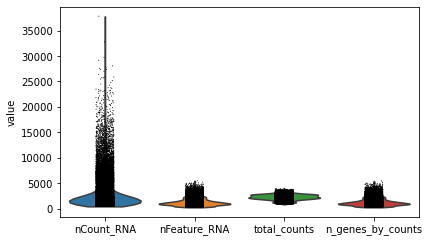

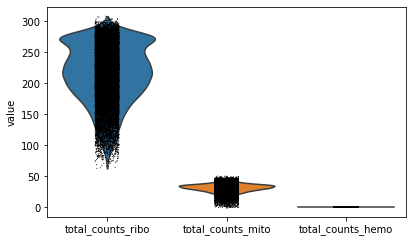

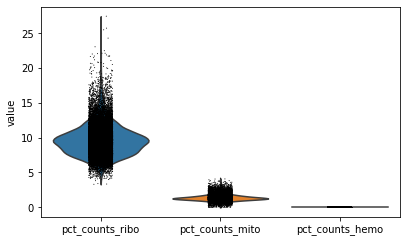

In [10]:
sc.pl.violin(adata, keys = ['nCount_RNA','nFeature_RNA', 'total_counts', 'n_genes_by_counts'])
sc.pl.violin(adata, keys = ['total_counts_ribo','total_counts_mito', 'total_counts_hemo'])
sc.pl.violin(adata, keys = ['pct_counts_ribo','pct_counts_mito', 'pct_counts_hemo'])

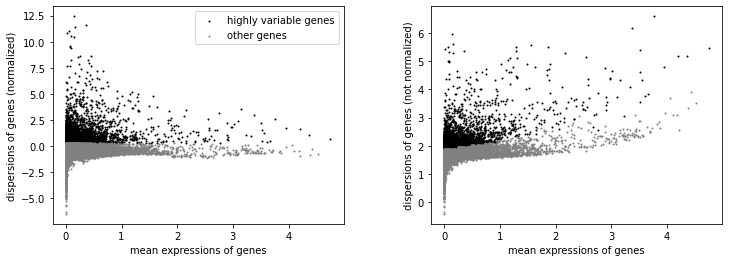

In [11]:
sc.pp.highly_variable_genes(adata, n_top_genes = 4000)
sc.pl.highly_variable_genes(adata)

In [12]:
adata.raw = adata

In [13]:
sc.pp.filter_genes(adata, min_cells=5)
sc.pp.filter_genes(adata, min_counts=10)

/home/karlan/miniconda3/envs/scanpy/lib/python3.9/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/home/karlan/miniconda3/envs/scanpy/lib/python3.9/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


In [14]:
adata.obs_names_make_unique()

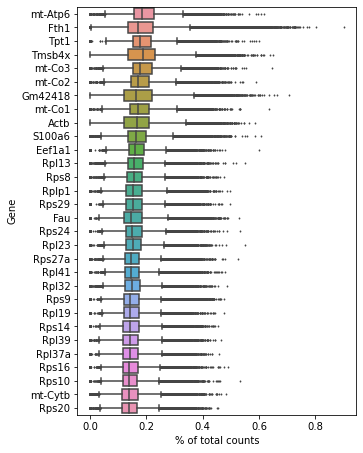

In [15]:
sc.pl.highest_expr_genes(adata)

In [16]:
sc.pp.scale(adata)

# umap and clustering

In [17]:
sc.pp.pca(adata)
bbknn.bbknn(adata, batch_key='orig.ident')
sc.tl.umap(adata, spread = 1)

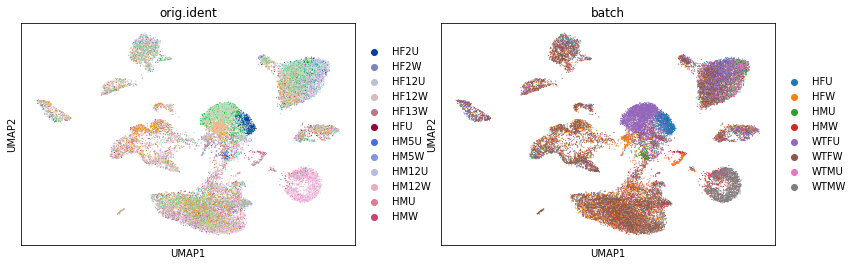

In [18]:
sc.pl.umap(adata, color = ['orig.ident', 'batch'])

In [19]:
sc.tl.leiden(adata, resolution = 0.3)

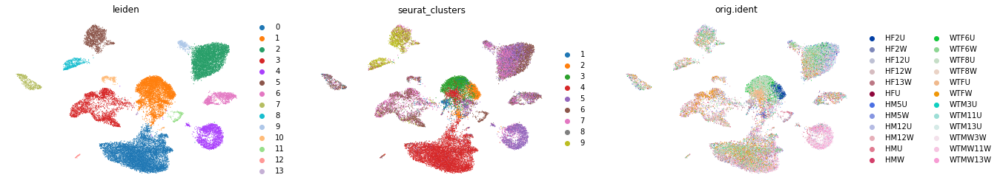

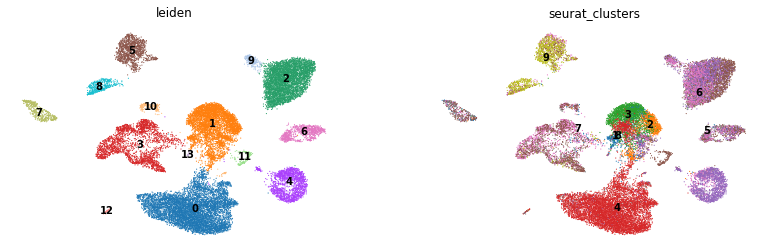

In [20]:
sc.pl.umap(adata, color = ['leiden', 'seurat_clusters', 'orig.ident'], frameon = False)
sc.pl.umap(adata, color = ['leiden', 'seurat_clusters'], frameon = False, legend_loc = 'on data')

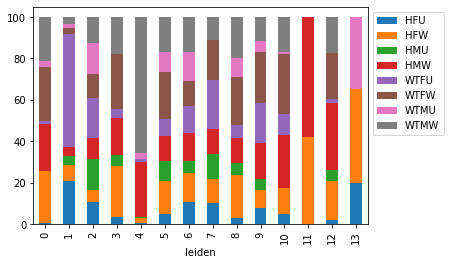

In [21]:
samp_dist = pd.DataFrame(adata.obs.groupby('leiden')['batch'].value_counts(normalize = True)*100).unstack()
samp_dist.columns = samp_dist.columns.droplevel(0)
ax = samp_dist.plot(kind = 'bar', stacked=True)
ax.legend(bbox_to_anchor = (1,1))

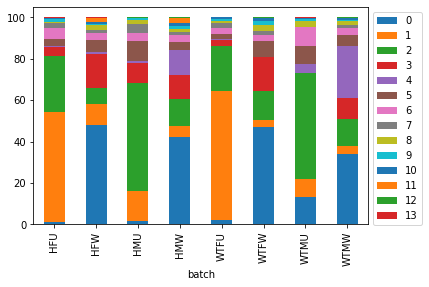

In [22]:
samp_dist = pd.DataFrame(adata.obs.groupby('batch')['leiden'].value_counts(normalize = True)*100).unstack()
samp_dist.columns = samp_dist.columns.droplevel(0)
ax = samp_dist.plot(kind = 'bar', stacked=True)
ax.legend(bbox_to_anchor = (1,1))

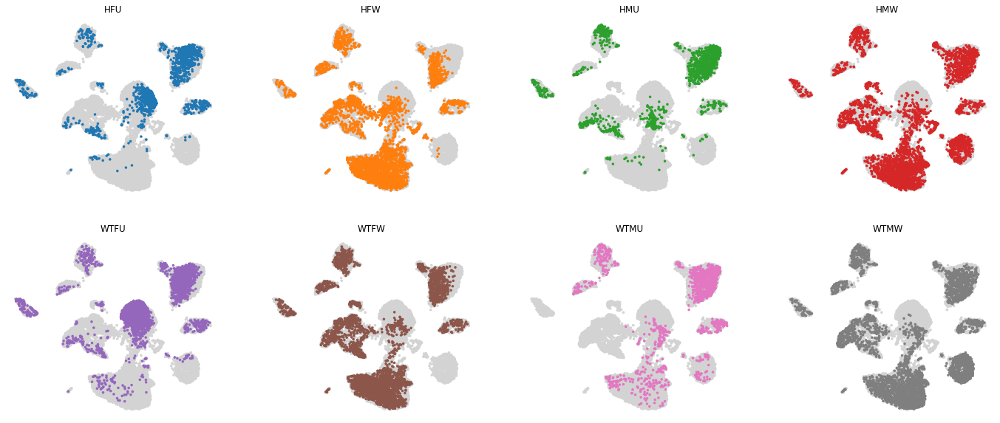

In [23]:
groups = adata.obs['batch'].unique()
ncols = 4
fig, axes = initialize_subplots(len(groups), ncols = ncols, figsize_multiplier=(6,5))

for ix, g in enumerate(sorted(groups)):
    ax = get_ax(axes, ix, ncols)
    sc.pl.umap(adata, color = 'batch', ax = ax, show = False, frameon = False, groups = [g], legend_loc = 'on_data', title = g, s = 50)
clear_output()

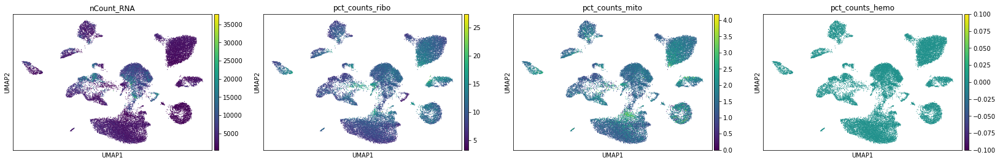

In [24]:
sc.pl.umap(adata, color = ['nCount_RNA', 'pct_counts_ribo','pct_counts_mito', 'pct_counts_hemo'])

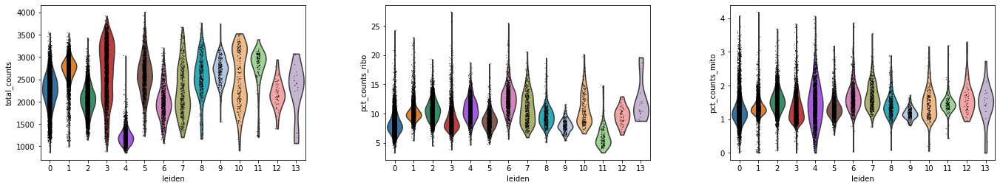

In [25]:
sc.pl.violin(adata, keys = ['total_counts','pct_counts_ribo', 'pct_counts_mito'], groupby='leiden')

## Identify main cell types

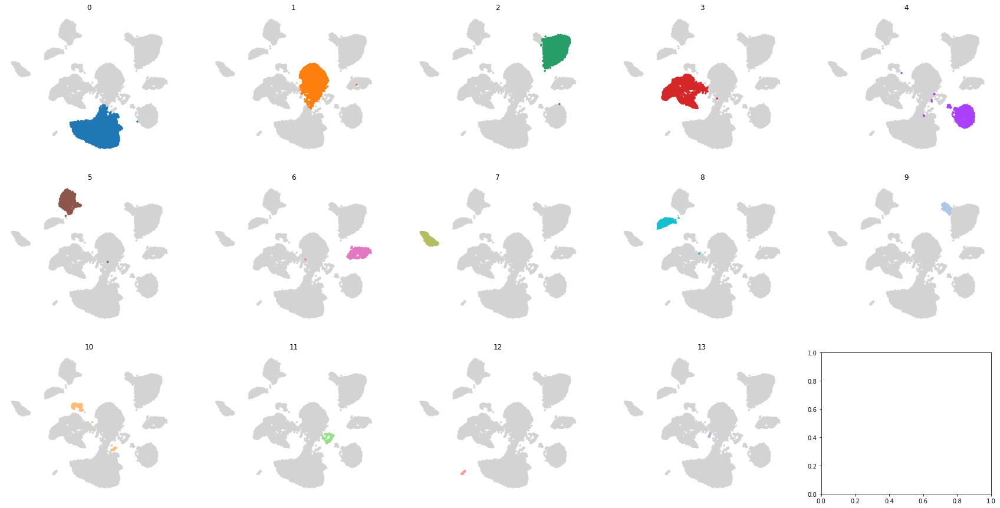

In [26]:
groups = adata.obs['leiden'].unique()
ncols = 5
fig, axes = initialize_subplots(len(groups), ncols = ncols, figsize_multiplier=(6,5))

for ix, g in enumerate(sorted(groups, key = lambda x: int(x))):
    ax = get_ax(axes, ix, ncols)
    sc.pl.umap(adata, color = 'leiden', ax = ax, show = False, frameon = False, groups = [g], legend_loc = 'on_data', title = g, s = 50)
clear_output()

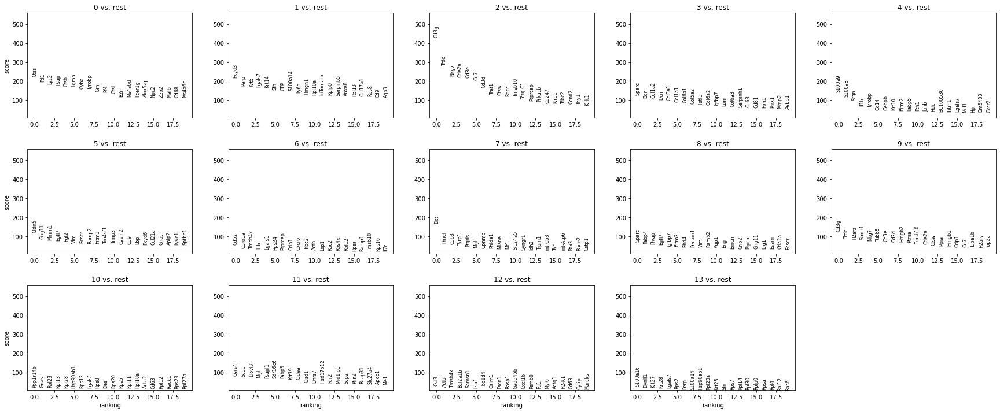

,0,1,2,3,4,5,6,7,8,9,10,11,12,13
0,Ctss,Fxyd3,Cd3g,Sparc,S100a9,Cldn5,Cd52,Dct,Sparc,Cd3g,Ppp1r14b,Cers4,Cst3,S100a16
1,Ftl1,Perp,Trdc,Bgn,S100a8,Gng11,Coro1a,Pmel,Fabp4,Trdc,Gnas,Scd1,Actb,Dynll1
2,Lyz2,Krt5,Nkg7,Col1a2,Srgn,Mmrn1,Tmsb4x,Cd63,Plvap,H2afz,Rpl23,Elovl3,Tmsb4x,Krt27
3,Psap,Lgals7,Ctla2a,Dcn,Il1b,Egfl7,Ltb,Tyrp1,Egfl7,Stmn1,Rpl13,Mgll,Bcl2a1b,Krt28
4,Ctsb,Krt14,Cd3e,Col3a1,Tyrobp,Fgl2,Lgals1,Ptgds,Igfbp7,Nkg7,Rpl28,Psapl1,Samsn1,Lgals7
5,Lgmn,Sfn,Cd7,Col1a1,Cd14,Vim,Rps24,Mgll,Ifitm3,Tubb5,Hsp90ab1,Sdr16c6,Lsp1,Rps2
6,Cyba,GFP,Cd3d,Col6a1,Cebpb,Ecscr,Ptprcap,Gpnmb,Ehd4,Cd3e,Rps13,Fabp5,Tbc1d4,Perp
7,Tyrobp,S100a14,Trat1,Col5a2,Krt10,Ramp2,Crip1,Phlda1,Pecam1,Cd3d,Lgals1,Krt79,Calm1,S100a14
8,Grn,Ly6d,Ctsw,Fstl1,Ifitm2,Ifitm3,Cxcr6,Mlana,Vim,Hmgb2,Rps8,Cidea,Fscn1,Hsp90ab1
9,Pf4,Hmgn1,Rgcc,Col6a2,Fabp5,Tm4sf1,Trbc2,Mt1,Ramp2,Ptma,Des,Cisd1,Basp1,Rpl23a


In [27]:
sc.tl.rank_genes_groups(adata, groupby = 'leiden')
sc.pl.rank_genes_groups(adata, ncols = 5)
pd.DataFrame(adata.uns['rank_genes_groups']['names']).head(20)

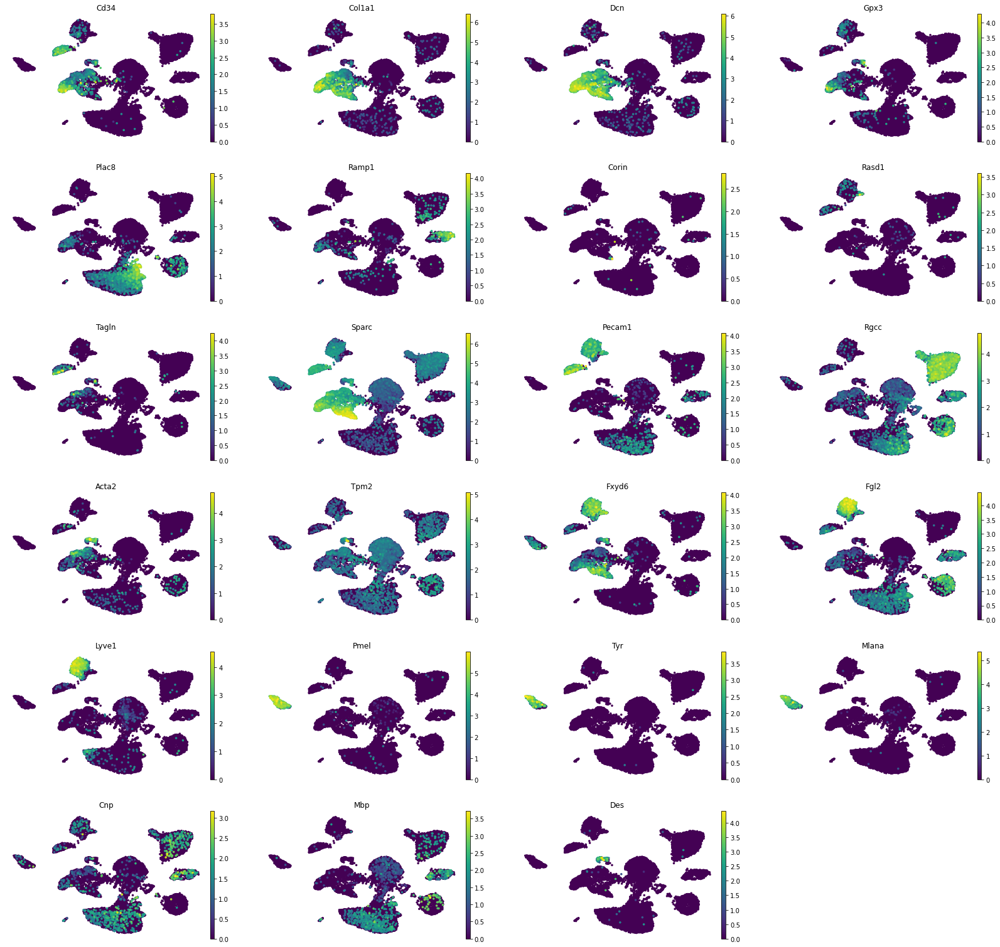

In [28]:
genes = ['Cd34', 'Col1a1', 'Dcn', 'Gpx3', 'Plac8', 'Ramp1', 'Corin', 'Rasd1', 'Tagln', 'Sparc', 'Pecam1', 'Rgcc', 'Acta2', 'Tpm2', 'Myl9', 'Fxyd6', 'Fgl2', 'Lyve1', 'Pmel', 'Tyr', 'Mlana', 'Cnp', 'Mbp', 'Mpz', 'Des', 'Acta1']
genes = [g for g in genes if g in adata.var_names]
sc.pl.umap(adata, color = genes, legend_loc='on data', frameon = False, s = 50)

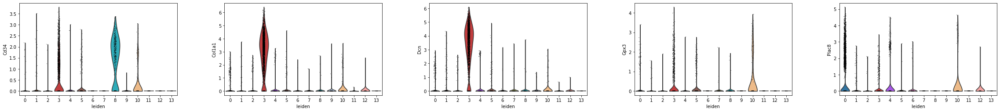

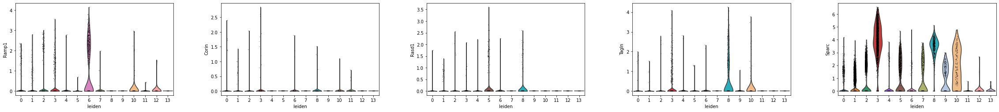

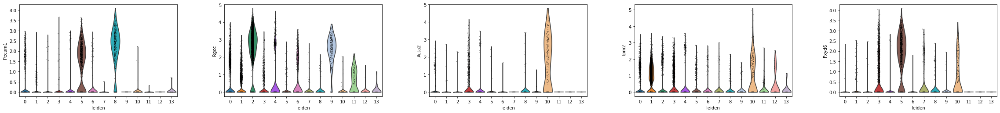

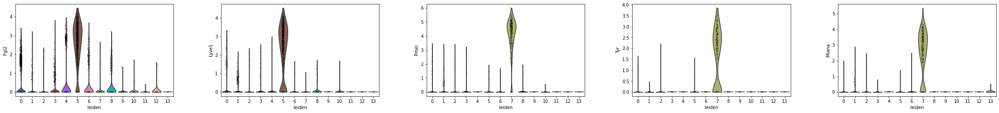

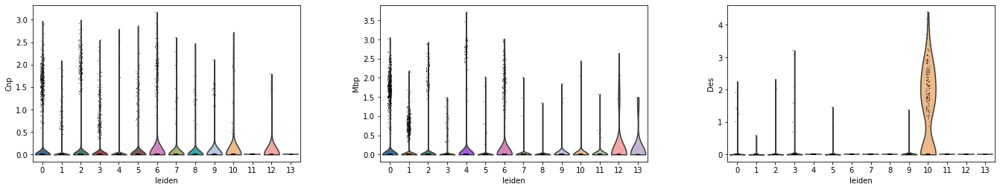

In [29]:
for i in range(0,len(genes), 5):
    sc.pl.violin(adata, keys = genes[i: i+5], groupby = 'leiden') 

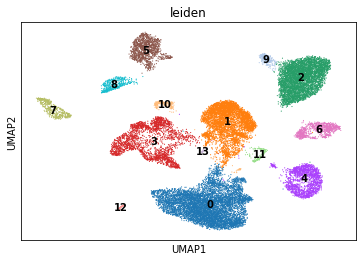

In [30]:
sc.pl.umap(adata, color = 'leiden', legend_loc = 'on data')

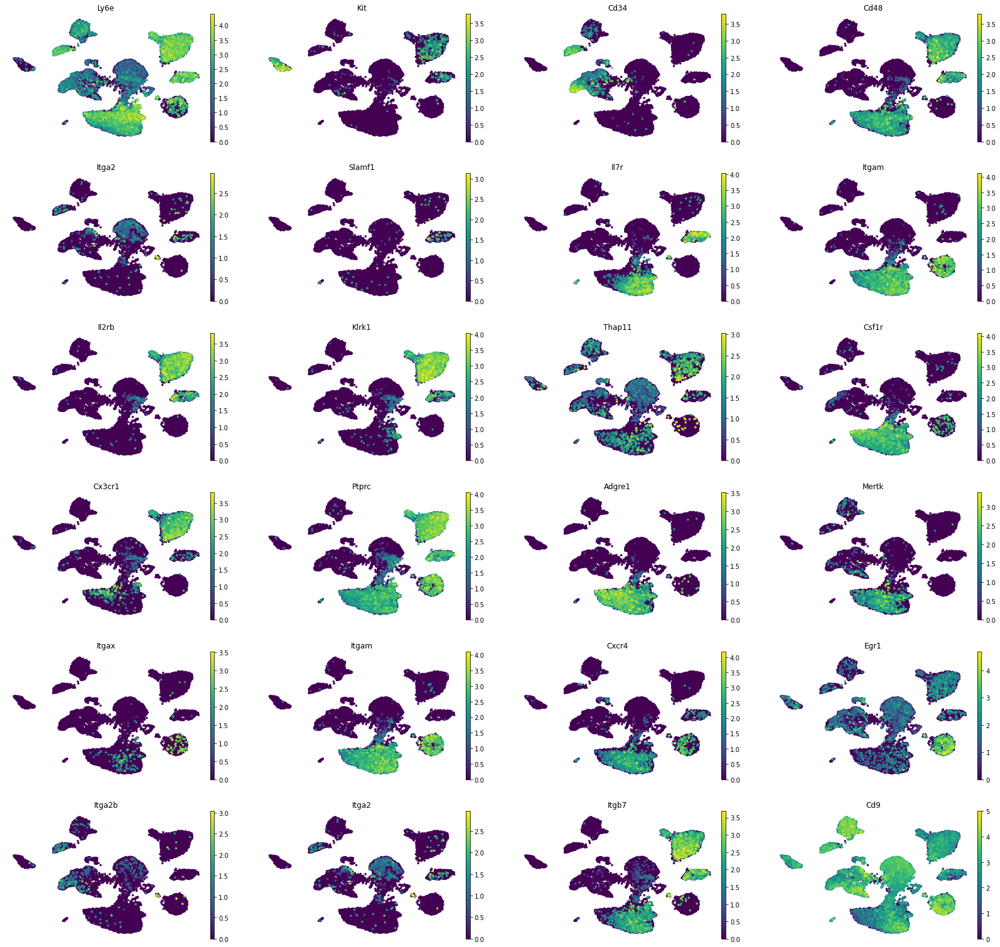

In [31]:
genes = ['Cd34', 'Ptprc', 'Cd3', 'Cd56', 'Cd49', 'NKp46', 'Cd19', 'Cd14', 'Cd11b', 'Cd68', 'Cd163', 'Cd11c', 'Hla-dr', 'Cd16', 'Cd18', 'Cd32', 'Cd44', 'Cd55', 'Cd125', 'Cd193', 'F4/80', 'Sigle-8', 'Cd22', 'Cd123', 'Cd32', 'Cd33', 'Cd117', 'Cd203c', 'Fceri', 'B220']
genes = ['Ly6e', 'Kit', 'Cd34', 'Cd48', 'Itga2', 'Flt3', 'Slamf1', 'Il7r', 'Itgam', 'Il2rb', 'Nkx1-1', 'Klrk1', 'Ncr1', 'Cde3', 'Thap11', 'Csf1r', 'Cx3cr1', 'Ptprc', 'Fcgr1bp', 'Adgre1', 'Mertk', 'Itgax', 'Cd24', 'Itgam', 'Cxcr4', 'Egr1', 'Itga2b', 'Itga2', 'Itgb7', 'Cd9', 'Gp1ba']
genes = [g for g in genes if g in adata.var_names]
sc.pl.umap(adata, color = genes, legend_loc='on data', frameon = False, s = 50)

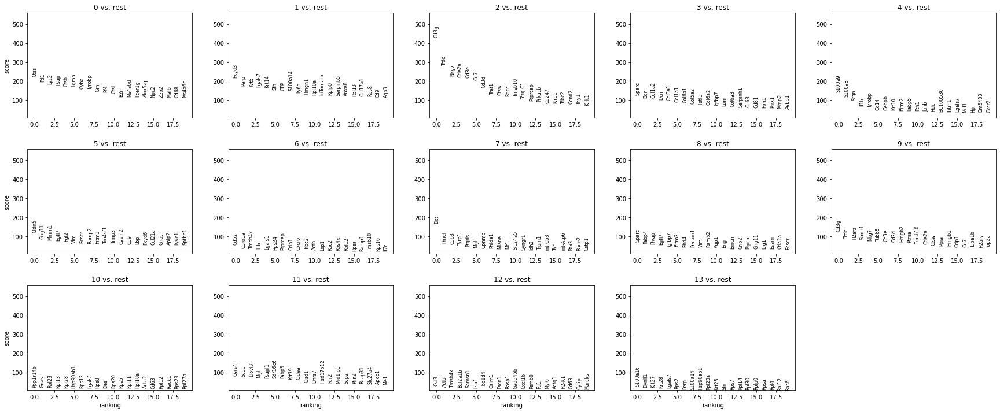

,0,1,2,3,4,5,6,7,8,9,10,11,12,13
0,Ctss,Fxyd3,Cd3g,Sparc,S100a9,Cldn5,Cd52,Dct,Sparc,Cd3g,Ppp1r14b,Cers4,Cst3,S100a16
1,Ftl1,Perp,Trdc,Bgn,S100a8,Gng11,Coro1a,Pmel,Fabp4,Trdc,Gnas,Scd1,Actb,Dynll1
2,Lyz2,Krt5,Nkg7,Col1a2,Srgn,Mmrn1,Tmsb4x,Cd63,Plvap,H2afz,Rpl23,Elovl3,Tmsb4x,Krt27
3,Psap,Lgals7,Ctla2a,Dcn,Il1b,Egfl7,Ltb,Tyrp1,Egfl7,Stmn1,Rpl13,Mgll,Bcl2a1b,Krt28
4,Ctsb,Krt14,Cd3e,Col3a1,Tyrobp,Fgl2,Lgals1,Ptgds,Igfbp7,Nkg7,Rpl28,Psapl1,Samsn1,Lgals7
5,Lgmn,Sfn,Cd7,Col1a1,Cd14,Vim,Rps24,Mgll,Ifitm3,Tubb5,Hsp90ab1,Sdr16c6,Lsp1,Rps2
6,Cyba,GFP,Cd3d,Col6a1,Cebpb,Ecscr,Ptprcap,Gpnmb,Ehd4,Cd3e,Rps13,Fabp5,Tbc1d4,Perp
7,Tyrobp,S100a14,Trat1,Col5a2,Krt10,Ramp2,Crip1,Phlda1,Pecam1,Cd3d,Lgals1,Krt79,Calm1,S100a14
8,Grn,Ly6d,Ctsw,Fstl1,Ifitm2,Ifitm3,Cxcr6,Mlana,Vim,Hmgb2,Rps8,Cidea,Fscn1,Hsp90ab1
9,Pf4,Hmgn1,Rgcc,Col6a2,Fabp5,Tm4sf1,Trbc2,Mt1,Ramp2,Ptma,Des,Cisd1,Basp1,Rpl23a


In [32]:
sc.tl.rank_genes_groups(adata, groupby = 'leiden')
sc.pl.rank_genes_groups(adata, ncols = 5)
pd.DataFrame(adata.uns['rank_genes_groups']['names']).head(20)

## Rough names for subsetting immune cells

In [33]:
leiden_named = {'0': 'IMM 1',
                '1': 'Mixed?',
                '2': 'NK',
                '3': 'FIB',
                '4': 'IMM 2',
                '5': 'Lymph',
                '6': 'IMM 3??',
                '7': 'MEL',
                '8': 'EC',
                '9': 'IMM 4',
                '10': 'vSM?',
                '11': 'SG',
                '12': 'IMM',
                '13': 'KC??'
                }

adata.obs['leiden_named'] = adata.obs['leiden'].apply(lambda x: leiden_named[x])

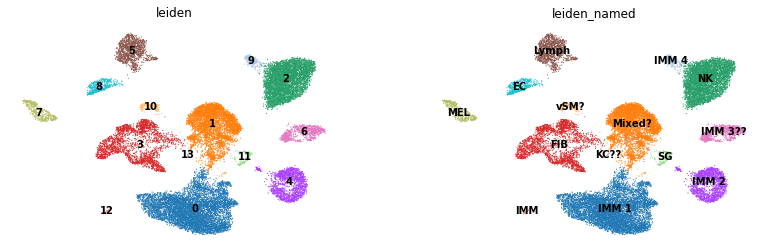

In [34]:
sc.pl.umap(adata, color = ['leiden', 'leiden_named'], legend_loc='on data', frameon = False)

# Subset Immune cells

In [35]:
raw_data = adata.copy()

In [36]:
adata = raw_data[raw_data.obs['leiden'].isin(['0', '2', '4', '6',  '9', '12'])].copy()

In [37]:
sc.pp.pca(adata)
bbknn.bbknn(adata, batch_key='orig.ident')
sc.tl.umap(adata, spread = 1)

In [38]:
sc.tl.leiden(adata, resolution = 0.7)

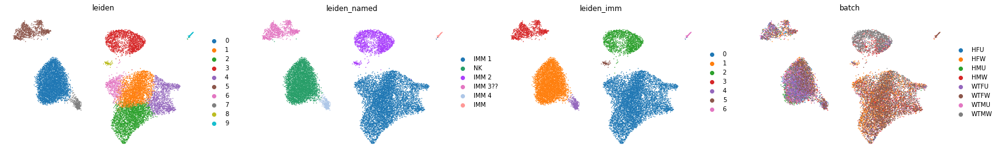

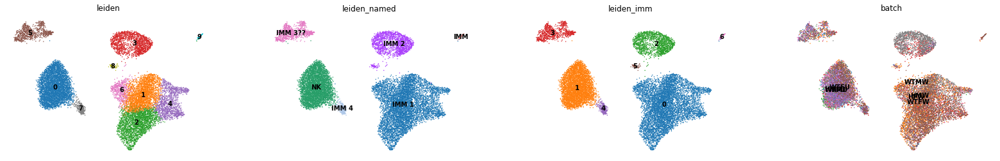

In [39]:
sc.tl.leiden(adata, key_added = 'leiden_imm', resolution = 0.3)
sc.pl.umap(adata, color = ['leiden', 'leiden_named', 'leiden_imm', 'batch'], frameon = False)
sc.pl.umap(adata, color = ['leiden', 'leiden_named', 'leiden_imm', 'batch'], legend_loc='on data', frameon = False)

## Sample distribution on umap

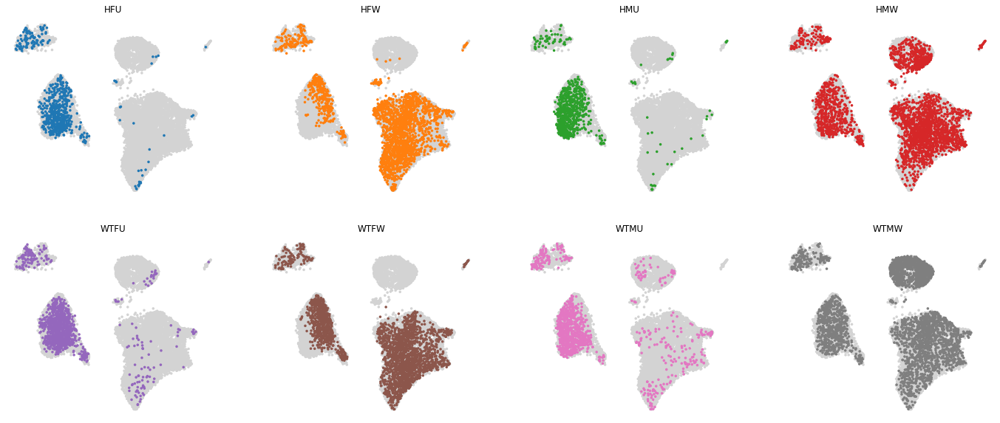

In [40]:
groups = adata.obs['batch'].unique()
ncols = 4
fig, axes = initialize_subplots(len(groups), ncols = ncols, figsize_multiplier=(6,5))

for ix, g in enumerate(sorted(groups)):
    ax = get_ax(axes, ix, ncols)
    sc.pl.umap(adata, color = 'batch', ax = ax, show = False, frameon = False, groups = [g], legend_loc = 'on_data', title = g, s = 50)
clear_output()

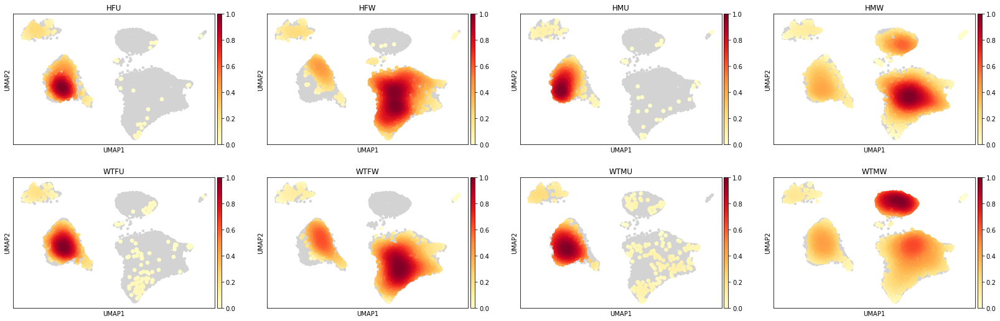

In [41]:
sc.tl.embedding_density(adata,groupby = 'batch')
sc.pl.embedding_density(adata, key = 'umap_density_batch')

## Sample distribution to clusters

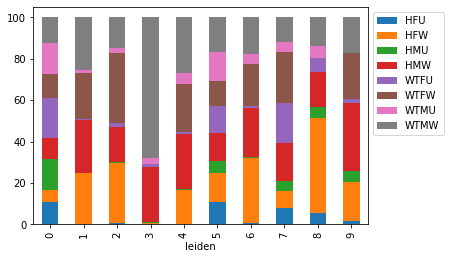

In [42]:
samp_dist = pd.DataFrame(adata.obs.groupby('leiden')['batch'].value_counts(normalize = True)*100).unstack()
samp_dist.columns = samp_dist.columns.droplevel(0)
ax = samp_dist.plot(kind = 'bar', stacked=True)
ax.legend(bbox_to_anchor = (1,1))

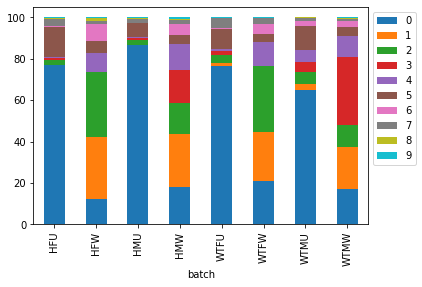

In [43]:
samp_dist = pd.DataFrame(adata.obs.groupby('batch')['leiden'].value_counts(normalize = True)*100).unstack()
samp_dist.columns = samp_dist.columns.droplevel(0)
ax = samp_dist.plot(kind = 'bar', stacked=True)
ax.legend(bbox_to_anchor = (1,1))

# Identify populations

## DGE

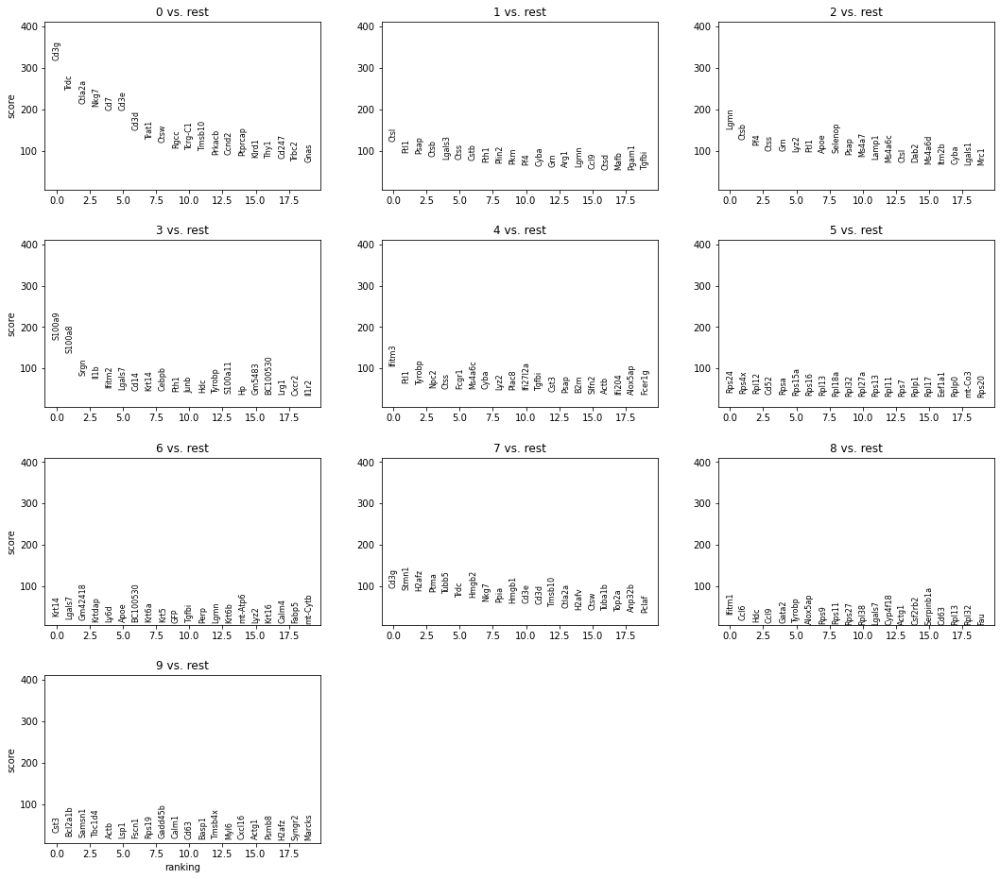

,0,1,2,3,4,5,6,7,8,9
0,Cd3g,Ctsl,Lgmn,S100a9,Ifitm3,Rps24,Krt14,Cd3g,Ifitm1,Cst3
1,Trdc,Ftl1,Ctsb,S100a8,Ftl1,Rps4x,Lgals7,Stmn1,Ccl6,Bcl2a1b
2,Ctla2a,Psap,Pf4,Srgn,Tyrobp,Rpl12,Gm42418,H2afz,Hdc,Samsn1
3,Nkg7,Ctsb,Ctss,Il1b,Npc2,Cd52,Krtdap,Ptma,Ccl9,Tbc1d4
4,Cd7,Lgals3,Grn,Ifitm2,Ctss,Rpsa,Ly6d,Tubb5,Gata2,Actb
5,Cd3e,Ctss,Lyz2,Lgals7,Fcgr1,Rps15a,Apoe,Trdc,Tyrobp,Lsp1
6,Cd3d,Cstb,Ftl1,Cd14,Ms4a6c,Rps16,BC100530,Hmgb2,Alox5ap,Fscn1
7,Trat1,Fth1,Apoe,Krt14,Cyba,Rpl13,Krt6a,Nkg7,Rps9,Rps19
8,Ctsw,Plin2,Selenop,Cebpb,Lyz2,Rpl18a,Krt5,Ppia,Rps11,Gadd45b
9,Rgcc,Pkm,Psap,Fth1,Plac8,Rpl32,GFP,Hmgb1,Rps27,Calm1


In [44]:
sc.tl.rank_genes_groups(adata, groupby = 'leiden')
sc.pl.rank_genes_groups(adata, ncols = 3)
pd.DataFrame(adata.uns['rank_genes_groups']['names']).head(20)

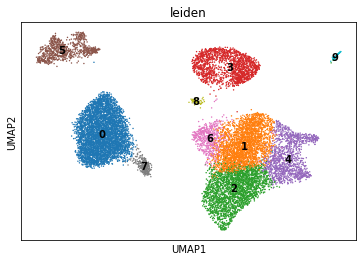

In [45]:
sc.pl.umap(adata, color = ['leiden'], legend_loc = 'on data')

## DETC

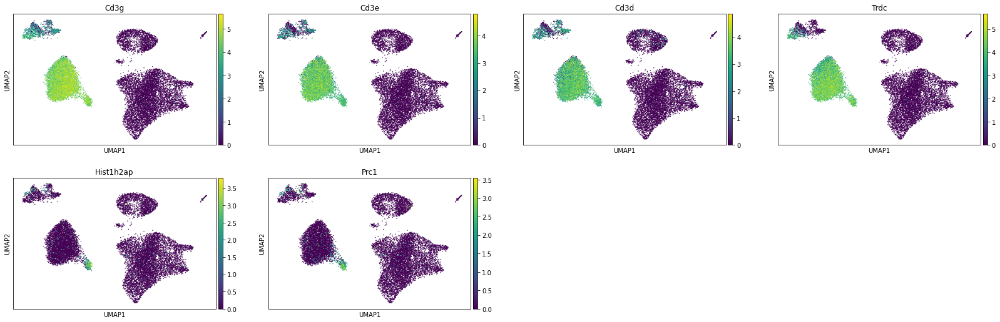

In [46]:
sc.pl.umap(adata, color = ['Cd3g','Cd3e','Cd3d','Trdc', 'Hist1h2ap', 'Prc1'])

## Macrophages

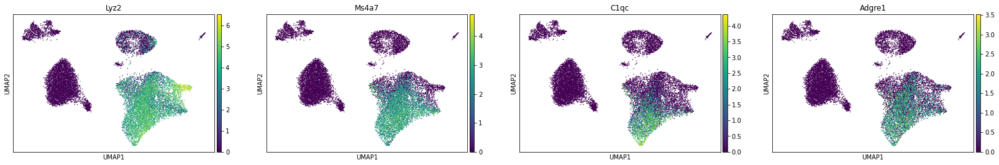

In [47]:
sc.pl.umap(adata, color = ['Lyz2', 'Ms4a7', 'C1qc', 'Adgre1'])

## Neutrophils

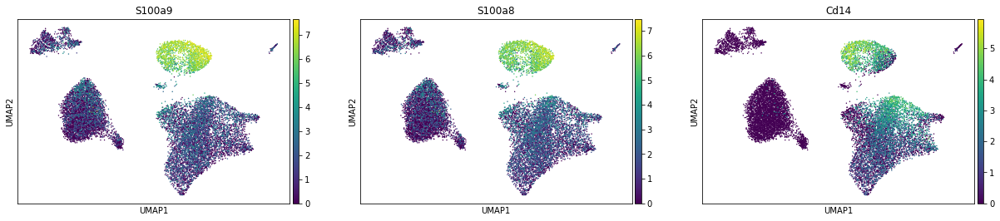

In [48]:
sc.pl.umap(adata, color = ['S100a9', 'S100a8', 'Cd14'])

## Monocytes

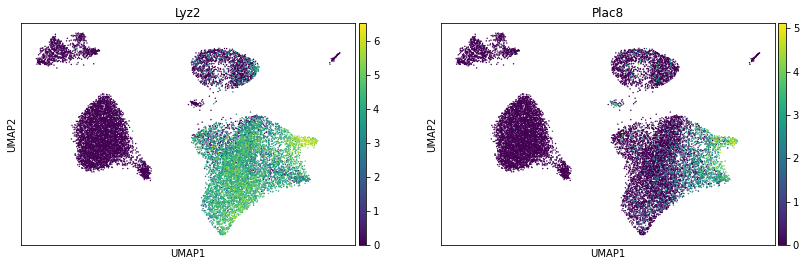

In [49]:
sc.pl.umap(adata, color = ['Lyz2','Plac8'])

## Dermal gdT-cells

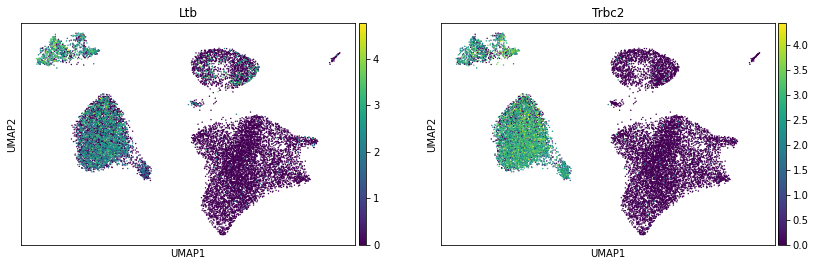

In [50]:
sc.pl.umap(adata, color = ['Ltb', 'Trbc2'])

## Granulocytes

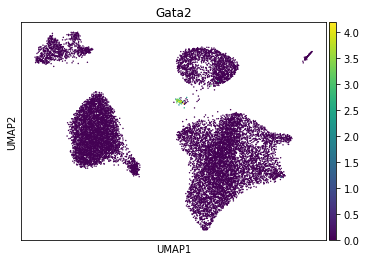

In [51]:
sc.pl.umap(adata, color = ['Gata2'])

## Migratory mature DC

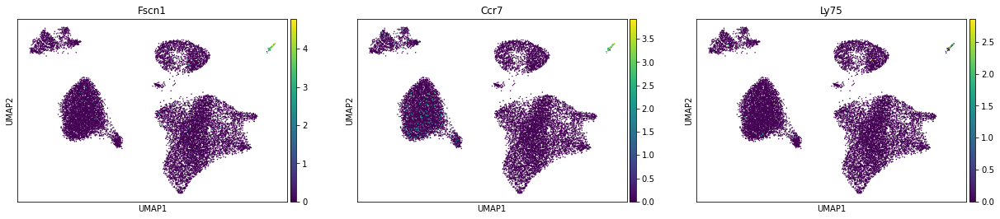

In [52]:
sc.pl.umap(adata, color = ['Fscn1','Ccr7','Ly75'])

# Name clusters

In [121]:
imm_named = {'0': 'DETC',
             '1': 'Macro M2',
             '2': 'Macro M1/M2',
             '3': 'Neutro',
             '4': 'Mono',
             '5': 'Dermal gdT',
             '6': 'Macro C',
             '7': 'DETC (prolif?)',
             '8': 'Granulo',
             '9': 'DC'
            }

adata.obs['leiden_named'] = adata.obs['leiden'].apply(lambda x: imm_named[x])

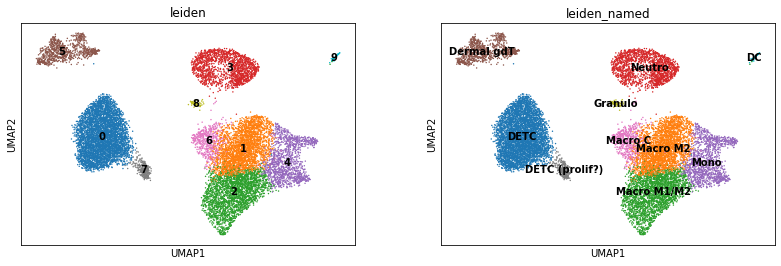

In [122]:
sc.pl.umap(adata, color = ['leiden', 'leiden_named'], legend_loc = 'on data')

# Save annotated immune cells

# Read in cells

In [8]:
path = '/mnt/c/Users/karla/OneDrive/OneDrive - Karolinska Institutet/Data/Papers/Greco/Sara/Loom files'
adata = sc.read_h5ad(os.path.join(path, 'IMMUNE_Only_subclustering.h5'))
adata.raw = sc.read_loom(os.path.join(path, 'IMMUNE_Only_subclustering_RAW.loom'))

# Continue plotting

In [9]:
adata.obs['sample_wound'] = ['Wound' if x[-1] == 'W' else 'Uninjured' for x in adata.obs['batch']]
adata.obs['sample_hras'] = ['Full' if x[-2] == 'F' else 'Mosaic' for x in adata.obs['batch']]
adata.obs['sample_type'] = ['WT' if x[:-2] == 'WT' else 'Hras' for x in adata.obs['batch']]

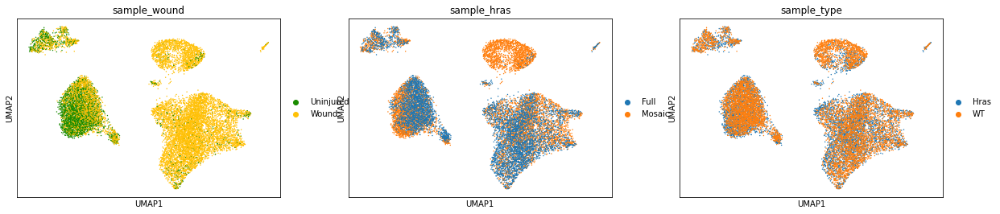

In [10]:
sc.pl.umap(adata, color = ['sample_wound','sample_hras','sample_type'])

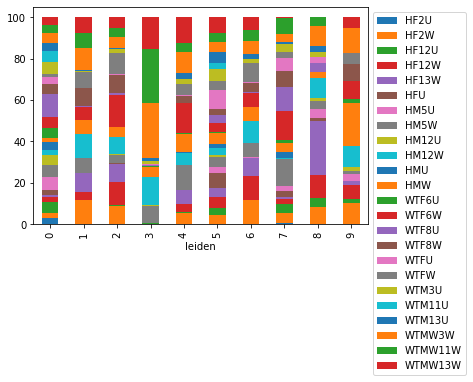

In [11]:
samp_dist = pd.DataFrame(adata.obs.groupby('leiden')['orig.ident'].value_counts(normalize = True)*100).unstack()
samp_dist.columns = samp_dist.columns.droplevel(0)
ax = samp_dist.plot(kind = 'bar', stacked=True)
ax.legend(bbox_to_anchor = (1,1))

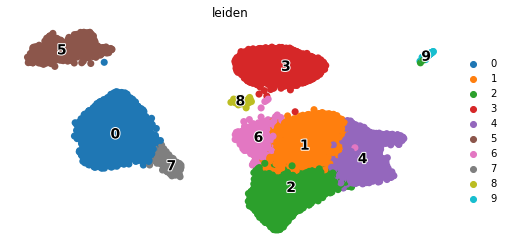

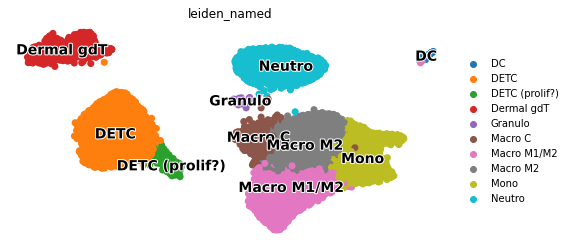

In [12]:
plot_umap_with_legends(adata)
plot_umap_with_legends(adata, color = 'leiden_named')

## Rename clusters

In [13]:
imm_named = {'0': 'DETC',
             '1': 'Mφ',
             '2': 'Mφ',
             '3': 'Neutro',
             '4': 'Mφ',
             '5': 'Dermal Lymphocytes',
             '6': 'Mφ',
             '7': 'DETC',
             '8': 'Granulo',
             '9': 'DC'
            }

adata.obs['cluster'] = adata.obs['leiden'].apply(lambda x: imm_named[x])

ax = axes[ix]


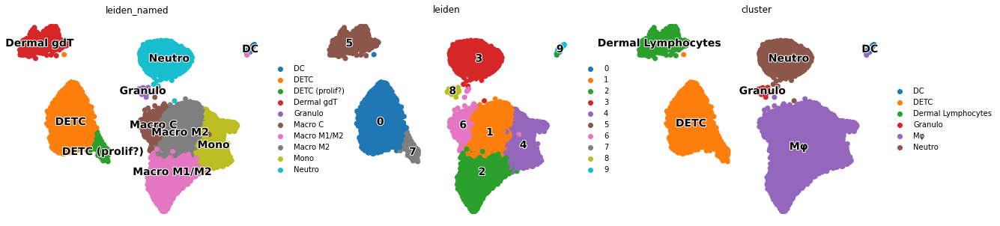

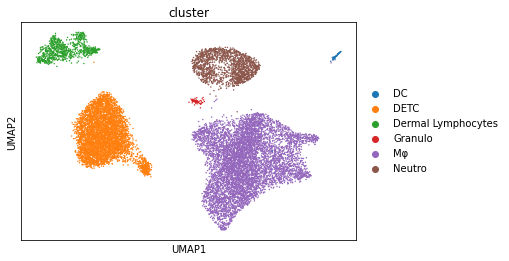

In [14]:
fig, axes = initialize_subplots(3, ncols = 3)
plot_umap_with_legends(adata, color='leiden_named', ax = axes[0])
plot_umap_with_legends(adata, color='leiden', ax = axes[1])
plot_umap_with_legends(adata, color='cluster', ax = axes[2])
sc.pl.umap(adata, color = 'cluster')

ax = axes[ix]


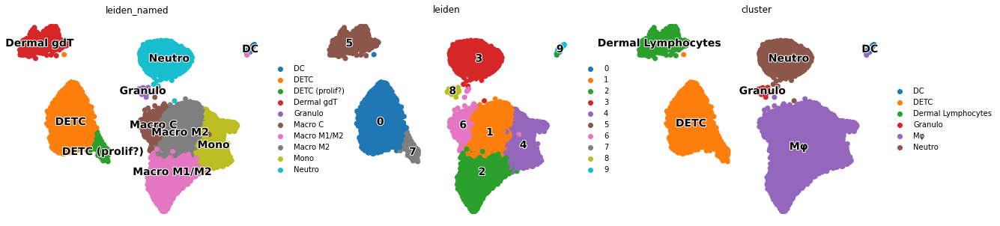

In [16]:
adata.obs['cluster'] = [cl if cl != 'Dermal Tc prolif' else 'Dermal Tc' for cl in adata.obs['cluster']]
fig, axes = initialize_subplots(3, ncols = 3)
plot_umap_with_legends(adata, color='leiden_named', ax = axes[0])
plot_umap_with_legends(adata, color='leiden', ax = axes[1])
plot_umap_with_legends(adata, color='cluster', ax = axes[2])

In [17]:
marker_genes_dict = {'DETC': ['Cd3e', 'Cd3g', 'Trdc','Cd3g'],
                     'Proliferating': ['Mki67', 'Prc1','Cenpm'],
                     'Dermal Tc': ['Ltb','Trbc2','Furin','Trdc'],
                     'Nk': ['Nkg7','Klrd1', 'Cd7','Ncam1'],
                     'B-cell': ['Blk'],
                     'Mφ': ['Ctss','Lgmn','Lyz2','Arg1','Cd163', 'Ms4a7','C1qc'],
                     'Mono': ['Ly6c2', 'Plac8'],
                     'Neutro': ['S100a9','S100a8','Cd14', 'Lrg1'],
                     'DC': ['Fscn1','Ccr7'],
                     'Granulo': ['Gata2']}

DETC


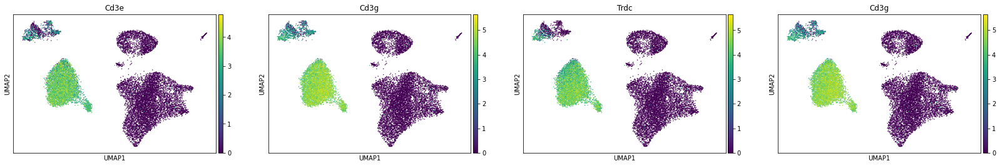

Proliferating


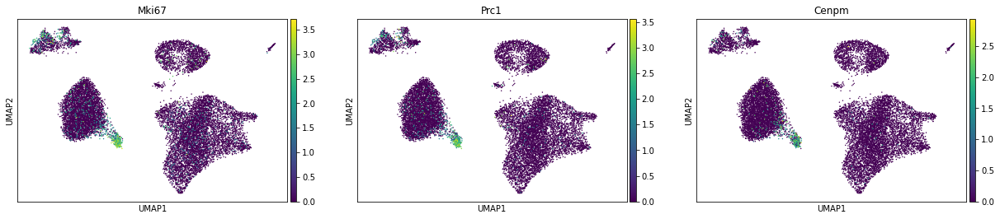

Dermal Tc


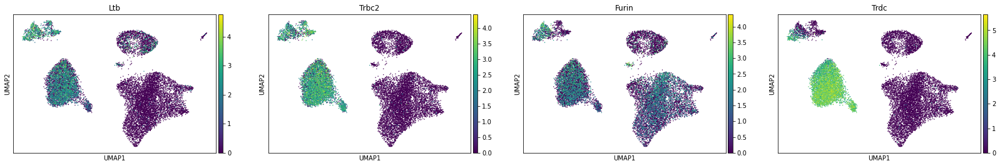

Nk


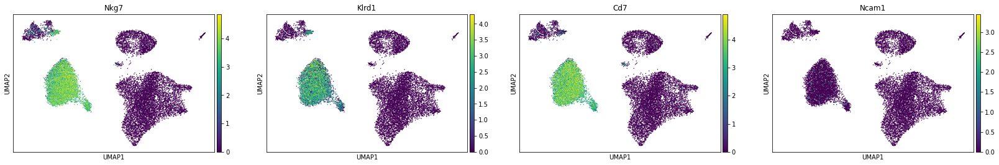

B-cell


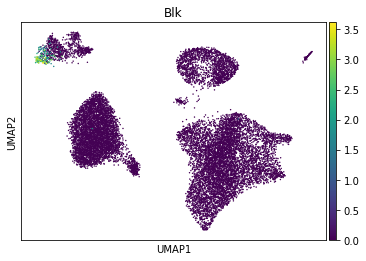

Mφ


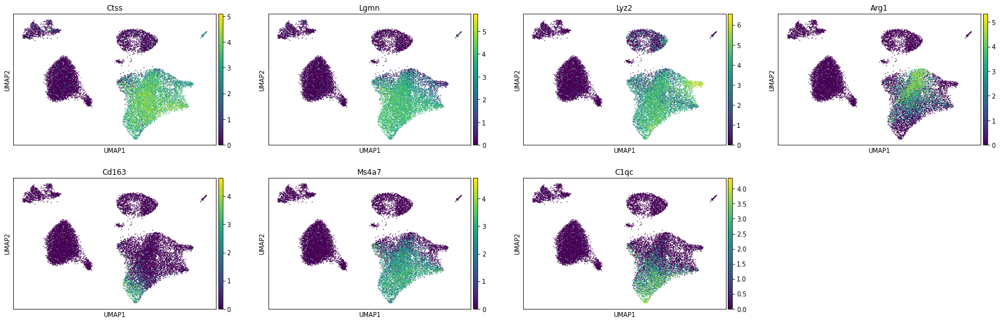

Mono


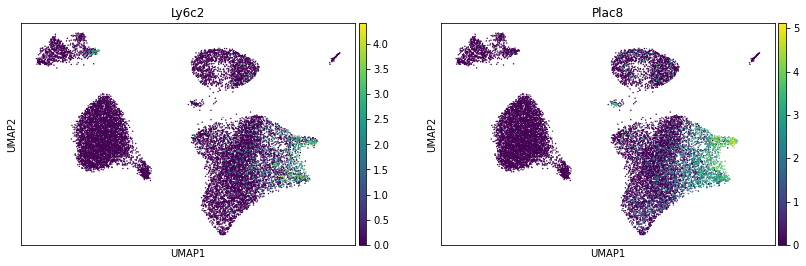

Neutro


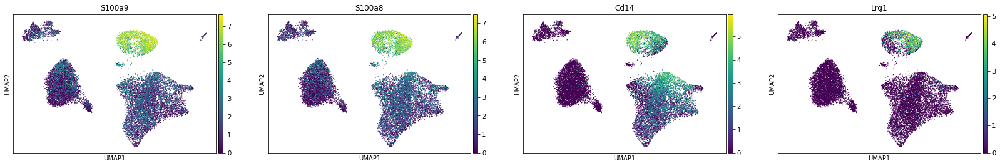

DC


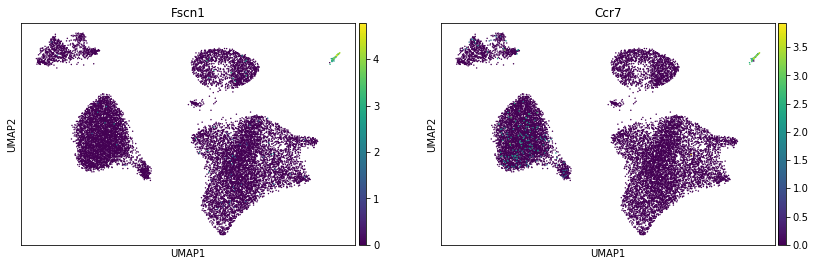

Granulo


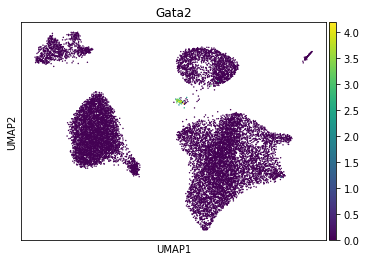

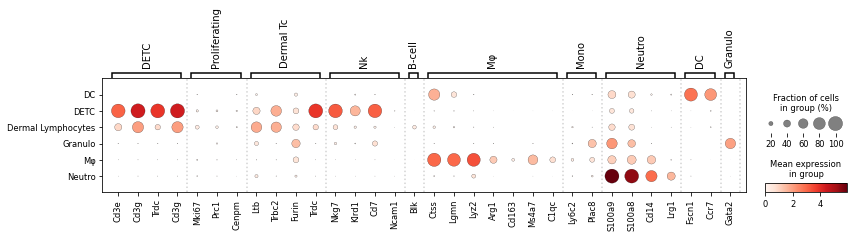

In [18]:
ncols = 5

for cl, gs in marker_genes_dict.items():
    print(cl)
    sc.pl.umap(adata, color = gs)
    plt.show()

ax_ = sc.pl.dotplot(adata, marker_genes_dict, groupby = 'cluster', show = False)
ax = ax_['mainplot_ax']

i = 0
for g in marker_genes_dict.values():
    i += len(g)
    ax.axvline(i, ls = ':', c = 'lightgray')

# Save annotations

In [4]:
path = '/mnt/c/Users/karla/OneDrive/OneDrive - Karolinska Institutet/Data/Papers/Greco/Sara/Loom files'
adata = sc.read_h5ad(os.path.join(path, 'IMMUNE_Only_subclustering.h5'))
adata.raw = sc.read_loom(os.path.join(path, 'IMMUNE_Only_subclustering_RAW.loom'))

# Plots for figures

In [19]:
fig_path = '/mnt/g/My Drive/MKA/Papers/Greco/Sara and Nur/Figures'

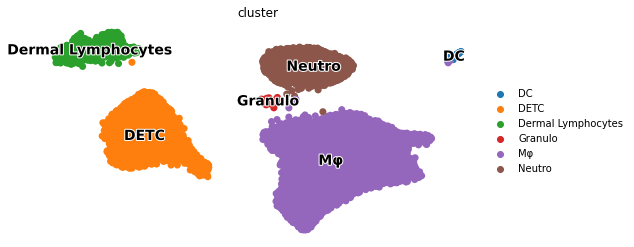

In [20]:
plot_umap_with_legends(adata, color = 'cluster')

In [21]:
sample = {'HMU': 'HMU',
          'HM5U': 'HMU', 
          'HM12U': 'HMU',
          'HM5W': 'HMW',
          'HM12W': 'HMW', 
          'HMW': 'HMW', 
          'WTM3U': 'WTMU', 
          'WTM11U': 'WTMU', 
          'WTM13U': 'WTMU',
          'WTMW3W': 'WTMW', 
          'WTMW11W': 'WTMW', 
          'WTMW13W': 'WTMW',
          'HF2W': 'HFW',
          'HF12W': 'HFW',
          'HF13W': 'HFW',
          'HFU': 'HFU',
          'HF12U': 'HFU',
          'HF2U': 'HFU',
          'WTFU': 'WTFU',
          'WTF6U': 'WTFU',
          'WTF8U': 'WTFU',
          'WTFW': 'WTFW',
          'WTF6W': 'WTFW',
          'WTF8W': 'WTFW'}
adata.obs['batch'] = adata.obs['orig.ident'].map(sample)

replicate = {'HMU': 'Mouse1',
             'HM5U': 'Mouse2', 
             'HM12U': 'Mouse3',
             'HMW': 'Mouse1',
             'HM5W': 'Mouse2', 
             'HM12W': 'Mouse3', 
             'WTM3U': 'Mouse1', 
             'WTM11U': 'Mouse2', 
             'WTM13U': 'Mouse3',
             'WTMW3W': 'Mouse1', 
             'WTMW11W': 'Mouse2', 
             'WTMW13W': 'Mouse3',
             'HF2W': 'Mouse1',
             'HF12W': 'Mouse2',
             'HF13W': 'Mouse3',
             'HFU': 'Mouse1',
             'HF12U': 'Mouse2',
             'HF2U': 'Mouse3',
             'WTFU': 'Mouse1',
             'WTF6U': 'Mouse2',
             'WTF8U': 'Mouse3',
             'WTFW': 'Mouse1',
             'WTF6W': 'Mouse2',
             'WTF8W': 'Mouse3'}
adata.obs['Replicate'] = adata.obs['orig.ident'].map(replicate)

In [23]:
sc.tl.score_genes_cell_cycle(adata, s_genes, g2m_genes)

## Fig S7a

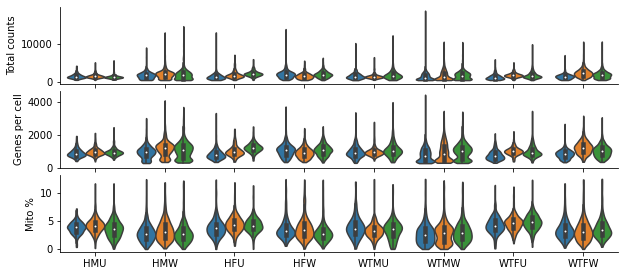

In [22]:
rename = {'nCount_RNA': 'Total counts', 
          'nFeature_RNA': 'Genes per cell', 
          'percent.mt': 'Mito %'}

plots = ['nCount_RNA', 'nFeature_RNA', 'percent.mt']
ncols = 1
fig, axes = initialize_subplots(len(plots), ncols = ncols, figsize_multiplier = (10, 1.5), sharex = True, print_help=False, gridspec_kw = {'hspace': 0.1})

for ix, y in enumerate(plots):
    ax = get_ax(axes, ix, ncols)
    sbn.violinplot(data = adata.obs, x = 'batch', y = y, hue = 'Replicate', inner = 'box', ax = ax, cut = 0, scale = 'width')
    handles, labels = ax.get_legend_handles_labels()
    #sbn.stripplot(data = adata.obs, x = 'batch', y = y, hue = 'Replicate', ax = ax, dodge = 0.25, color = 'k', s = 0.3)
    if y == 'nCount_RNA':
        #ax.legend(handles = handles, labels = labels, bbox_to_anchor = (1.4,1), frameon = False)
        ax.legend('', frameon = False)
        #ax.set_yticks([0, 5000, 10000, 20000])
    else:
        ax.legend('', frameon = False)
        ax.set_ylim(bottom = -0.5)
        ax.yaxis.set_major_locator(MaxNLocator(integer=True, nbins = 3, min_n_ticks = 2))
        
    
    [ax.spines[spine].set_visible(False) for spine in ['top','right']]
    ax.set_ylabel(rename[y])
    ax.set_xlabel('')
#[fig.savefig(os.path.join(fig_path, f'IMM_QC_replicates.{f}'), bbox_inches = 'tight') for f in ['pdf','png']]

## Fig S7b

ax = axes[ix // ncols, ix % ncols]
[<AxesSubplot:>]
[<AxesSubplot:>]
[<AxesSubplot:>]
[<AxesSubplot:>]


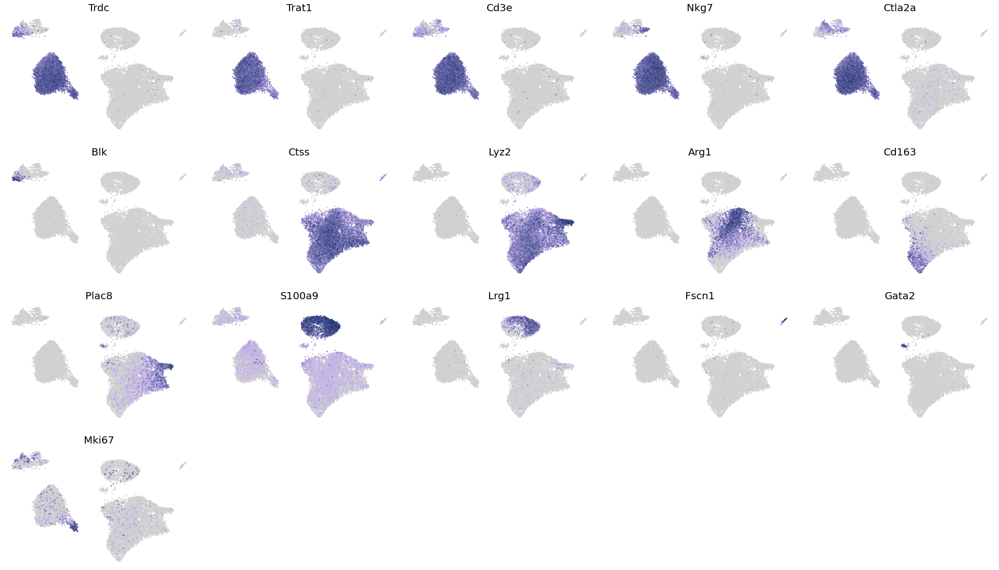

In [38]:
genes = ['Trdc', 'Trat1', 'Cd3e', 'Nkg7', 'Ctla2a', 'Blk', 'Ctss', 'Lyz2', 'Arg1', 'Cd163', 'Plac8', 'S100a9', 'Lrg1', 'Fscn1', 'Gata2', 'Mki67']

norm = mpl.colors.Normalize(-1,1)
colors = [[norm(-1.0), "#D1D1D1"],
          [norm(0), "#c1aded"],
          [norm( 1.0), "#1f326e"]]

cmap = mpl.colors.LinearSegmentedColormap.from_list("", colors)

s = 30
ncols = 5
fig, axes = initialize_subplots(len(genes), ncols = ncols, gridspec_kw = {'wspace':0.05}, figsize_multiplier = (7,5))

for ix, g in enumerate(genes):
    ax = get_ax(axes, ix, ncols)
    sc.pl.umap(adata, color = g, show = False, ax = ax, frameon = False, cmap = cmap, s = s)
    ax.set_title(g, fontsize = 20)
    cbar = ax.collections[-1].colorbar.remove()
    
clean_subplots(ix, axes, ncols)
#fig.savefig(os.path.join(fig_path, f'IMM_UMAP_Genes_{"_".join(genes)}_colorbar_v2.pdf'), bbox_inches = 'tight')

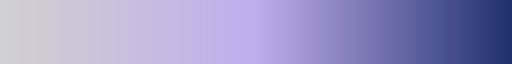

In [39]:
cmap

## Fig S7c

Text(0.5, 1.0, '')

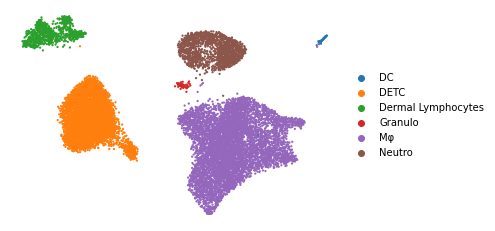

In [29]:
fig, ax = plt.subplots()
sc.pl.umap(adata, color = 'cluster', ax = ax, frameon = False, show = False, s = 20)
ax.set_title('')
#fig.savefig(os.path.join(fig_path, 'IMM_UMAP_clusters.pdf'), bbox_inches = 'tight')

## Fig S7d

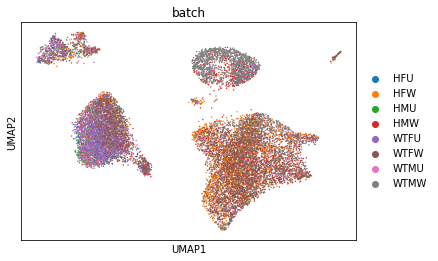

In [31]:
sc.pl.umap(adata, color = 'batch')

In [32]:
batches = adata.obs['batch'].cat.categories
wtmw_color = adata.uns['batch_colors'][batches.tolist().index('WTMW')]
wtmu_color = adata.uns['batch_colors'][batches.tolist().index('WTMU')]

colors = {b: adata.uns['batch_colors'][ix] for ix, b in enumerate(batches)}
remapped_colors = {b: colors['WTMW'] if b == 'WTMU' else colors['WTMU'] if b == 'WTMW' else c for b, c in colors.items()}

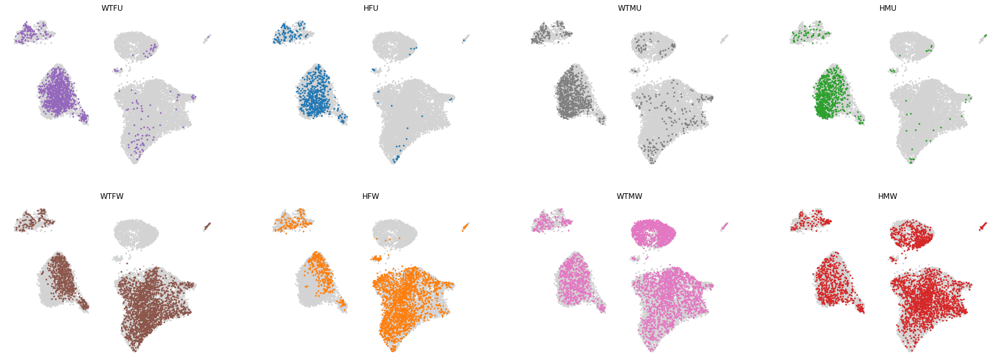

In [34]:
groups = ['WTFU', 'HFU', 'WTMU', 'HMU', 'WTFW', 'HFW', 'WTMW', 'HMW']
ncols = 4
fig, axes = initialize_subplots(len(groups), ncols = ncols)

for ix, g in enumerate(groups):
    ax = get_ax(axes, ix, ncols)
    sc.pl.umap(adata, color = 'batch', groups = g, show = False, ax = ax, frameon = False, legend_loc = '', s = 30, palette = remapped_colors)
    ax.set_title(g)
clear_output()

#fig.savefig(os.path.join(fig_path, 'IMM_UMAP_Batches_separate_v2.pdf'), bbox_ionches = 'tight')

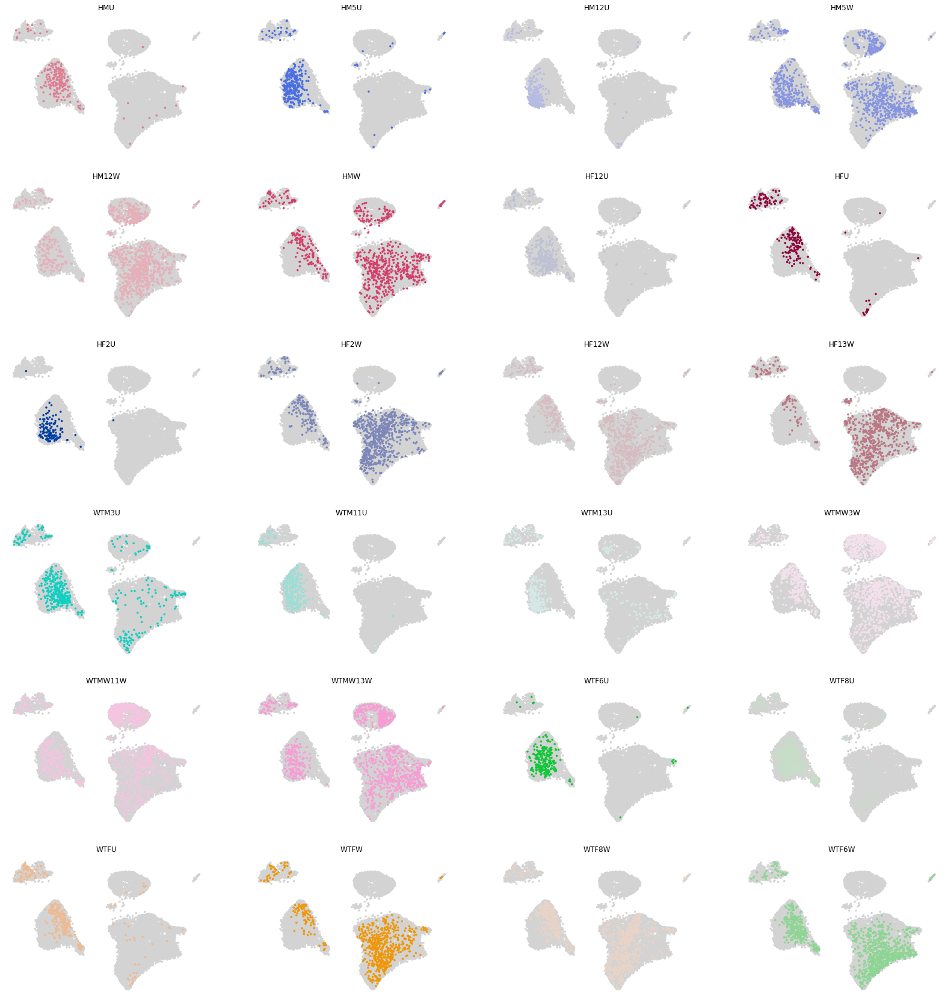

In [174]:
groups = adata.obs['orig.ident'].unique()
ncols = 4
fig, axes = initialize_subplots(len(groups), ncols = ncols)

for ix, g in enumerate(groups):
    ax = get_ax(axes, ix, ncols)
    sc.pl.umap(adata, color = 'orig.ident', groups = g, show = False, ax = ax, frameon = False, legend_loc = '', s = 50)
    ax.set_title(g)
clear_output()

#fig.savefig(os.path.join(fig_path, 'IMM_UMAP_Batches_separate.pdf'), bbox_ionches = 'tight')

## Fig S7e

Text(0.5, 1.0, '')

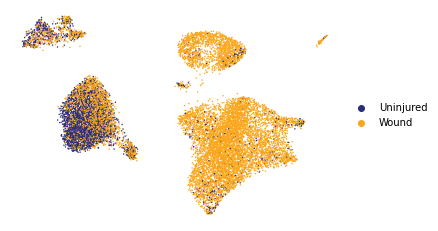

In [25]:
cmap = {'Uninjured': '#2A2D7C',
        'Wound': '#FAA51A'}
fig, ax = plt.subplots()
sc.pl.umap(adata, color = 'sample_wound', ax = ax, frameon = False, show = False, palette = cmap)
ax.set_title('')
#fig.savefig(os.path.join(fig_path, 'IMM_UMAP_Wound_v2.pdf'), bbox_inches = 'tight')

Text(0.5, 1.0, '')

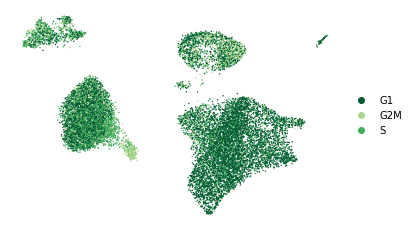

In [26]:
cmap = {'G1': '#035B32',
        'G2M': '#B0D78F',
        'S': '#42AC5D'}
fig, ax = plt.subplots()
sc.pl.umap(adata, color = 'phase', ax = ax, frameon = False, show = False, palette = cmap)
ax.set_title('')
#fig.savefig(os.path.join(fig_path, 'IMM_UMAP_phase_v2.pdf'), bbox_inches = 'tight')

## Plot EGFR ligand violinplots

In [41]:
ras_map = {'HMW': 'Hras', 'HMU': 'Hras', 'WTMW': 'WT', 'WTMU': 'WT',
           'HFW': 'Hras', 'HFU': 'Hras', 'WTFW': 'WT', 'WTFU': 'WT'}
adata.obs['Hras'] = adata.obs['batch'].map(ras_map).copy()

## Fig S7f

In [56]:
#Some weirdness with statsmodels import, have to import it twice
import statsmodels.api as sm
import statsmodels as sm

### All combined

ax = axes[ix]


[None, None]

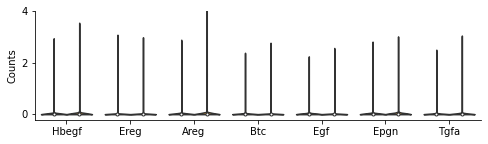

In [42]:
fontsize = 12
genes = ['Hbegf', 'Ereg', 'Areg', 'Btc', 'Egf', 'Epgn', 'Tgfa']

cmap = {'Uninjured': '#2A2D7C',
        'Wound': '#FAA51A'}

comparison = 'sample_wound'
groups = 'leiden_named'

cols = ['names','scores','pvals','pvals_adj','logfoldchanges']

fig, ax = initialize_subplots(1, ncols = 1, figsize_multiplier=(8, 2), sharex = True, gridspec_kw = {'hspace': 0.01})

newline = '\n'
df = adata.obs[[comparison, groups]].copy()
df[genes] = adata.raw[:, genes].X.A
df = df.melt(id_vars = comparison, value_vars=genes, var_name = 'Gene',value_name = 'Counts')

sbn.violinplot(data = df, x = 'Gene', y = 'Counts', hue = comparison, cut = 0, ax = ax, inner = 'box', palette = cmap, scale = 'width')

df['Counts'] = [x + round(np.random.uniform(-0.1, 0.1), 3) if x == 0 else x for x in df['Counts']]

ax.set_ylim(top = 4)
tick_locator = mpl.ticker.MaxNLocator(nbins=3, integer = True, min_n_ticks = 2)
ax.yaxis.set_major_locator(tick_locator)
ax.set_xlabel('')
#ax.legend(bbox_to_anchor = (1.15,1))
ax.legend('', frameon = False)
[ax.spines[spine].set_visible(False) for spine in ['top', 'right']]

#[fig.savefig(os.path.join(fig_path, f'IMM_Violinplot_Combined_Ligands_boxplot.{f}'), bbox_inches = 'tight') for f in ['pdf','png']]

In [43]:
df_ = adata.obs.copy()
df_[genes] = adata.raw[:, genes].X.A

res = {}
for g in genes:
    df = df_.groupby(['sample_wound', 'orig.ident'])[g].mean()
    df = df.reset_index().pivot(index = 'sample_wound', columns = 'orig.ident')
    df.columns = df.columns.droplevel(0)
    w = df[[c for c in df.columns if c.endswith('W')]].loc['Wound'].dropna().values
    h = df.loc['Uninjured'].dropna().values
    stat, p = scipy.stats.ttest_ind(h, w)
    if p > 0.05:
        res[g] = np.round(p, decimals=3)
    else:
        res[g] = float(f'{p:.2e}')
res

{'Hbegf': 0.00159,
 'Ereg': 0.078,
 'Areg': 0.011,
 'Btc': 0.411,
 'Egf': 0.14,
 'Epgn': 0.0276,
 'Tgfa': 0.043}

In [57]:
pvals = [0.00159, 0.078, 0.011, 0.411, 0.14, 0.0276, 0.043]
adj_pvals = sm.stats.multitest.multipletests(pvals, alpha = 0.05)[1]
[float(x) for x in adj_pvals]

[0.011077050365283156,
 0.216222552,
 0.06421140134953444,
 0.411,
 0.2604,
 0.130589760384193,
 0.16122060919899997]

### WT mosaic

ax = axes[ix]


Text(0, 0.5, 'WT_Mosaic')

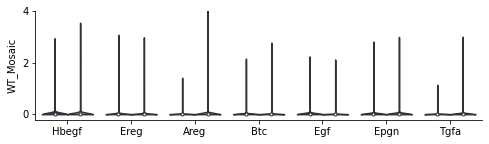

In [45]:
fontsize = 12
genes = ['Hbegf', 'Ereg', 'Areg', 'Btc', 'Egf', 'Epgn', 'Tgfa']

comp = ['WT', 'Mosaic']

cmap = {'Uninjured': '#2A2D7C',
        'Wound': '#FAA51A'}

comparison = 'sample_wound'
groups = 'leiden_named'

cols = ['names','scores','pvals','pvals_adj','logfoldchanges']

fig, ax = initialize_subplots(1, ncols = 1, figsize_multiplier=(8, 2), sharex = True, gridspec_kw = {'hspace': 0.01})

newline = '\n'
df = adata.obs.copy()
df[genes] = adata.raw[:, genes].X.A
df = df[(df['Hras']==comp[0]) & (df['sample_hras']==comp[1])]
df = df.melt(id_vars = comparison, value_vars=genes, var_name = 'Gene',value_name = 'Counts')

sbn.violinplot(data = df, x = 'Gene', y = 'Counts', hue = comparison, cut = 0, ax = ax, inner = 'box', palette = cmap, scale = 'width')

df['Counts'] = [x + round(np.random.uniform(-0.1, 0.1), 3) if x == 0 else x for x in df['Counts']]

ax.set_ylim(top = 4)
tick_locator = mpl.ticker.MaxNLocator(nbins=3, integer = True, min_n_ticks = 2)
ax.yaxis.set_major_locator(tick_locator)
ax.set_xlabel('')
#ax.legend(bbox_to_anchor = (1.15,1))
ax.legend('', frameon = False)
[ax.spines[spine].set_visible(False) for spine in ['top', 'right']]
ax.set_ylabel(f'{comp[0]}_{comp[1]}')

#[fig.savefig(os.path.join(fig_path, f'IMM_Violinplot_{comp[0]}_{comp[1]}_Ligands_boxplot.{f}'), bbox_inches = 'tight') for f in ['pdf','png']]

In [46]:
df_ = adata.obs.copy()
df_[genes] = adata.raw[:, genes].X.A
df_ = df_[(df_['Hras']==comp[0]) & (df_['sample_hras']==comp[1])]

res = {}
for g in genes:
    df = df_.groupby(['sample_wound', 'orig.ident'])[g].mean()
    df = df.reset_index().pivot(index = 'sample_wound', columns = 'orig.ident')
    df.columns = df.columns.droplevel(0)
    w = df[[c for c in df.columns if c.endswith('W')]].loc['Wound'].dropna().values
    h = df.loc['Uninjured'].dropna().values
    stat, p = scipy.stats.ttest_ind(h, w)
    if p > 0.05:
        res[g] = np.round(p, decimals=3)
    else:
        res[g] = float(f'{p:.2e}')
print(f'{comp[0]} {comp[1]}')
res

WT Mosaic


{'Hbegf': 0.493,
 'Ereg': 0.356,
 'Areg': 0.0242,
 'Btc': 0.527,
 'Egf': 0.174,
 'Epgn': 0.4,
 'Tgfa': 0.143}

In [58]:
pvals = [0.493, 0.356, 0.0242, 0.527, 0.174, 0.4, 0.143]
adj_pvals = sm.stats.multitest.multipletests(pvals, alpha = 0.05)[1]
[float(x) for x in adj_pvals]

[0.827994050304,
 0.827994050304,
 0.15758576588100218,
 0.827994050304,
 0.615496553814624,
 0.827994050304,
 0.6038269476520791]

### Hras mosaic

ax = axes[ix]


Text(0, 0.5, 'Hras_Mosaic')

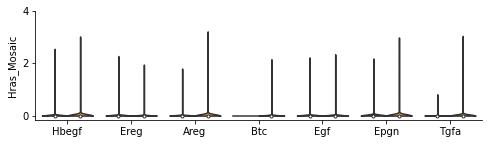

In [47]:
fontsize = 12
genes = ['Hbegf', 'Ereg', 'Areg', 'Btc', 'Egf', 'Epgn', 'Tgfa']

comp = ['Hras', 'Mosaic']

cmap = {'Uninjured': '#2A2D7C',
        'Wound': '#FAA51A'}

comparison = 'sample_wound'
groups = 'leiden_named'

cols = ['names','scores','pvals','pvals_adj','logfoldchanges']

fig, ax = initialize_subplots(1, ncols = 1, figsize_multiplier=(8, 2), sharex = True, gridspec_kw = {'hspace': 0.01})

newline = '\n'
df = adata.obs.copy()
df[genes] = adata.raw[:, genes].X.A
df = df[(df['Hras']==comp[0]) & (df['sample_hras']==comp[1])]
df = df.melt(id_vars = comparison, value_vars=genes, var_name = 'Gene',value_name = 'Counts')

sbn.violinplot(data = df, x = 'Gene', y = 'Counts', hue = comparison, cut = 0, ax = ax, inner = 'box', palette = cmap, scale = 'width')

df['Counts'] = [x + round(np.random.uniform(-0.1, 0.1), 3) if x == 0 else x for x in df['Counts']]

ax.set_ylim(top = 4)
tick_locator = mpl.ticker.MaxNLocator(nbins=3, integer = True, min_n_ticks = 2)
ax.yaxis.set_major_locator(tick_locator)
ax.set_xlabel('')
#ax.legend(bbox_to_anchor = (1.15,1))
ax.legend('', frameon = False)
[ax.spines[spine].set_visible(False) for spine in ['top', 'right']]
ax.set_ylabel(f'{comp[0]}_{comp[1]}')

#[fig.savefig(os.path.join(fig_path, f'IMM_Violinplot_{comp[0]}_{comp[1]}_Ligands_boxplot.{f}'), bbox_inches = 'tight') for f in ['pdf','png']]

In [50]:
df_ = adata.obs.copy()
df_[genes] = adata.raw[:, genes].X.A
df_ = df_[(df_['Hras']==comp[0]) & (df_['sample_hras']==comp[1])]

res = {}
for g in genes:
    df = df_.groupby(['sample_wound', 'orig.ident'])[g].mean()
    df = df.reset_index().pivot(index = 'sample_wound', columns = 'orig.ident')
    df.columns = df.columns.droplevel(0)
    w = df[[c for c in df.columns if c.endswith('W')]].loc['Wound'].dropna().values
    h = df.loc['Uninjured'].dropna().values
    stat, p = scipy.stats.ttest_ind(h, w)
    if p > 0.05:
        res[g] = np.round(p, decimals=3)
    else:
        res[g] = float(f'{p:.2e}')
print(f'{comp[0]} {comp[1]}')
res

Hras Mosaic


{'Hbegf': 0.00972,
 'Ereg': 0.766,
 'Areg': 0.178,
 'Btc': 0.0174,
 'Egf': 0.452,
 'Epgn': 0.2,
 'Tgfa': 0.0429}

In [59]:
pvals = [0.00972, 0.766, 0.178, 0.0174, 0.452, 0.2, 0.043]
adj_pvals = sm.stats.multitest.multipletests(pvals, alpha = 0.05)[1]
[float(x) for x in adj_pvals]

[0.06608778455191197,
 0.766,
 0.543451132144,
 0.0999625950676656,
 0.699696,
 0.543451132144,
 0.19728812300344298]

# Compare wound and uninjured

In [10]:
import statsmodels.api as sm
import statsmodels as sm

### Try different plots for rebuttal

In [31]:
import statsmodels.api as sm
import statsmodels as sm

## Separate WT and Hras

## corrections

### FIB

In [122]:
import statsmodels.api as sm
import statsmodels as sm

#### h

In [128]:
pvals = [1.07e-11, 4.17e-8, 0.423, 0.284, 0.762, 0.997, 0.714]
adj_pvals = sm.stats.multitest.multipletests(pvals, alpha = 0.05)[1]
[float(x) for x in adj_pvals]

[7.48999999975957e-11,
 2.5019997391665144e-07,
 0.889158280959,
 0.811823619175424,
 0.976606344,
 0.997,
 0.976606344]

#### i

In [129]:
pvals = [0.0026, 0.025]
adj_pvals = sm.stats.multitest.multipletests(pvals, alpha = 0.05)[1]
[float(x) for x in adj_pvals]

[0.00519324, 0.025]

In [130]:
pvals = [0.0014, 0.0032]
adj_pvals = sm.stats.multitest.multipletests(pvals, alpha = 0.05)[1]
[float(x) for x in adj_pvals]

[0.0027980400000000003, 0.0032]

### IMM

In [131]:
pvals = [0.00159, 0.078, 0.011, 0.411, 0.14, 0.0276, 0.043]
adj_pvals = sm.stats.multitest.multipletests(pvals, alpha = 0.05)[1]
[float(x) for x in adj_pvals]

[0.011077050365283156,
 0.216222552,
 0.06421140134953444,
 0.411,
 0.2604,
 0.130589760384193,
 0.16122060919899997]

In [132]:
pvals = [0.493, 0.356, 0.0242, 0.527, 0.174, 0.4, 0.143]
adj_pvals = sm.stats.multitest.multipletests(pvals, alpha = 0.05)[1]
[float(x) for x in adj_pvals]

[0.827994050304,
 0.827994050304,
 0.15758576588100218,
 0.827994050304,
 0.615496553814624,
 0.827994050304,
 0.6038269476520791]

In [133]:
pvals = [0.00972, 0.766, 0.178, 0.0174, 0.452, 0.2, 0.043]
adj_pvals = sm.stats.multitest.multipletests(pvals, alpha = 0.05)[1]
[float(x) for x in adj_pvals]

[0.06608778455191197,
 0.766,
 0.543451132144,
 0.0999625950676656,
 0.699696,
 0.543451132144,
 0.19728812300344298]

### EPI

In [134]:
pvals = [2.16e-5, 3.5e-5, 6.06e-6, 3.29e-7, 0.483, 8e-5, 1.92e-7]
adj_pvals = sm.stats.multitest.multipletests(pvals, alpha = 0.05)[1]
[float(x) for x in adj_pvals]

[8.639720068031056e-05,
 0.00010499632504287499,
 3.0299632766225443e-05,
 1.9739983763857122e-06,
 0.483,
 0.0001599936,
 1.3439992258562476e-06]

In [136]:
pvals = [0.000311, 4.86e-5, 0.00035, 0.0085, 0.42, 0.00282, 9.91e-5]
adj_pvals = sm.stats.multitest.multipletests(pvals, alpha = 0.05)[1]
[float(x) for x in adj_pvals]

[0.0015540330907555383,
 0.0003401504028574987,
 0.0015540330907555383,
 0.016927750000000002,
 0.42,
 0.008436165225768,
 0.0005944527073133987]

In [137]:
pvals = [0.00601, 0.00819, 0.0038, 5.47e-7, 0.954, 0.0169, 0.00106]
adj_pvals = sm.stats.multitest.multipletests(pvals, alpha = 0.05)[1]
[float(x) for x in adj_pvals]

[0.023824146422542374,
 0.024369321053258997,
 0.018856147678224352,
 3.828993716616728e-06,
 0.954,
 0.03351439,
 0.006343169801390874]

In [138]:
pvals = [0.0083, 0.026]
adj_pvals = sm.stats.multitest.multipletests(pvals, alpha = 0.05)[1]
[float(x) for x in adj_pvals]

[0.00838236, 0.026]

## FIB EPI Fig5

In [142]:
pvals = [0.00722, 0.00022, 0.00161, 0.00621]
adj_pvals = sm.stats.multitest.multipletests(pvals, alpha = 0.05)[1]
[float(x) for x in adj_pvals]

[0.012381435900000001,
 0.0008797096425896575,
 0.004822227873281001,
 0.012381435900000001]